# Paul Adams

# Objective 1: Future Acquisitions 
Build a regressor that recommends the county and state that should be considered for future acquisitions based on Acreage > 180, Number of Unique Properties Available, and Price per Acre. If you believe that there are additional or better variables to use to make the determination please include them.

# This model assumes price per acre is a function of unique properties per acre and that land scarcity results in land value appreciation.
High quality land that has less overhead and does not proportionately benefit as much from economies of scale (enough resources are available, such as water, that expenses to source water - for example - are minimal and therefore, sourcing large volumes of it from long distances is not needed for sustainability - thus disproving the need for economies of scale) is more likely to be competitive and have more ownership segmentation (more properties per acre in a valuable area). For example, a greenhouse farm in the desert would benefit from economies of scale and would not likely be a great place for investment compared to fertile farmland.

Without having more insight into the types of crops and other metrics determining yield, profitability and expenses such as taxes, the model is limited for finding optimized farm investment locations. Given the missingness in the data, no other features beyond acreage, number of unique properties, and price per acre were used at this time. Additional data would help fine tune this model and is something I would work to get if employed at AcreTrader.

The approach leverages a price optimization equation based on linear regression to make a recommendation for County/State combinations. The County and State were combined since the counties are within the states. If this was for a longitude-latitude assessment, a separate model would be constructed to predict ideal longitude and another for ideal latitude, with residual errors from each model combined to assess the total error. As additional terms would be added to each model under the longitude-latitude scenario, combined error between models would be compared, with the lowest aggregated error representing the best model. The extra sum of squares approach would also be useful for comparing additional linear models for this objective.

# Business Assumptions and Justifications of this Model
The underlying business assumption of this model is that scarcity of land drives real estate prices higher, possibly as a result of an abundance of resources. Therefore, this model is based on finding demand and assumes that investors will rush to concentrated areas in an attempt to purchase land, increasing both property per acre as well as price per acre, which this model finds, to not be a false assumption (null hypothesis rejected; p-value < 0.0001, 95% confidence interval \[58.227, 91.572]). Using a starting intercept for price per acre of 3.22 (p-value < 0.0001, 95% confidence interval \[3.168, 3.268]), price scales linearly by 74.9 for each additional unit of property per acre that is added. In other words, as more properties per acre exist, the price increases, appreciating the investment. Therefore, it would be ideal to invest in an area with the most properties per acre as this is a good sign of a successful farming community, pointing to good resources such as supplies, distribution routes, and markets, among others.



# Technical Assessment
Because of the lack of more data, the model is relatively imprecise (low r-squared value). However, the relationship between properties_per_acre and price_per_acre is reliable. The low r-squared value means there is a reasonably large amount of error around the regression line and the farther from the line, the less reliably the model. Adding additional terms to the model may improve this fit. For example, agricultural revenue per county, crops per county interacting with revenue yield per crop type per unit, or tax rates for a cost component. This could result in more fluctuation between counties and therefore, a more dynamic relationship.

# Conclusion
This model identified **Burt County, Nebraska** as the best place to invest in a farm. Burt County is on the eastern edge of the Ogallala Aquifer and western edge (sometimes on both edges) of the Missouri River, both likely providing mineral deposits into the soil as well as crop irrigation supply. Burt County also contains four major highways - highways 75, 77, 51, and 32 - is across the Missouri River from Interstate Highway 29, and is 54 miles from Omaha, Nebraska, where the Union Pacific Railroad - the largest railroad in the United States - is headquartered. Omaha is considered a major domestic transportation hub, nicknamed the "Gate City of the  West." Therefore, proximity to the city is a major benefit to commerce. However, important to note is that there is a risk of flooding in Burt County; the Missouri River shifts here and snow melt is also a concern, in addition to rain. Major flooding occurred most recently in 1993, 2008, 2015, and 2019.

There is one 180-acre property in Burt County for $1,084,500.00. It has the highest value of properties per acre. At this point, time series data about this property could be useful for building a forecasting model to learn more about agriculture in this county, such as historic patterns and trends. This could provide more understanding about the property and what could be expected of it in the next few years.

In [1]:
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport
import warnings
warnings.filterwarnings('ignore')

original_data = pd.read_csv('/home/pablo/Desktop/AcreTrader/farms.csv')

original_data.shape

(10000, 33)

In [2]:
df = original_data[original_data['acres']>180]
df.shape

(1409, 33)

In [3]:
df['price'] = df['price'].str.replace('$', '').astype(float);

### To find the right features to use for modeling, I analyze the missingness of variables and collinearity between terms using the correlation matrix.

In [99]:
profile = ProfileReport(df, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/47 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
df2 = df[['acres', 'price', 'state', 'county', 'acres', 'price_per_acre', 'address']]

There are missing addresses so replacing them all with integers

In [5]:
j=1
address_id = []

for i in range(0, len(df2)):
    address_id.append(j)
    j+=1

df2['address'] = address_id

In [6]:
df2['county_state'] = df['county'] + '_' + df['state']

In [7]:
unique_properties = df2.groupby(by='county_state', as_index=False).agg({'address': pd.Series.nunique})

In [8]:
unique_properties.columns = ['county_state','unique_properties']

In [9]:
unique_properties.head()

,county_state,unique_properties
0,Abbeville_SC,1
1,Adair_KY,1
2,Adair_OK,3
3,Adams_MS,2
4,Adams_WI,3


In [10]:
unique_properties.shape

(752, 2)

In [11]:
df3 = df2.iloc[:,1:8].drop(['address', 'state','county', 'price_per_acre'], axis=1) # dropping duped acres

In [13]:
df4 = df3.groupby(by='county_state', as_index=False).agg({'price': pd.Series.sum, 'acres':pd.Series.sum})

In [14]:
df5 = df4.merge(unique_properties, on='county_state')

In [15]:
df5['price_per_acre'] = df5['price']/df5['acres']
df5['properties_per_acre'] = df5['unique_properties']/df5['acres']

In [16]:
df6 = df5.drop(['acres','price','unique_properties'], axis=1)

In [17]:
df_cat = df6.iloc[:,0]
df_num = df6.iloc[:,1:]

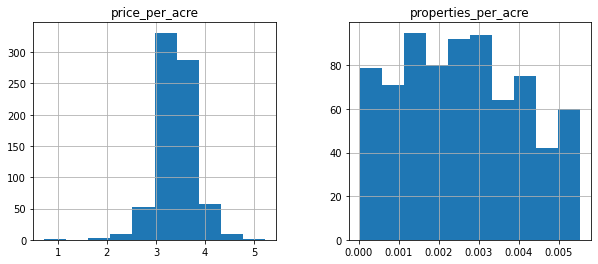

In [20]:
import matplotlib.pyplot as plt

dataset = pd.DataFrame(df_num)

dataset.hist(figsize=(10,4))
plt.show()

Normalize the price_per_acre variable:

In [18]:
df_num['price_per_acre'] = np.log10(df_num['price_per_acre'])

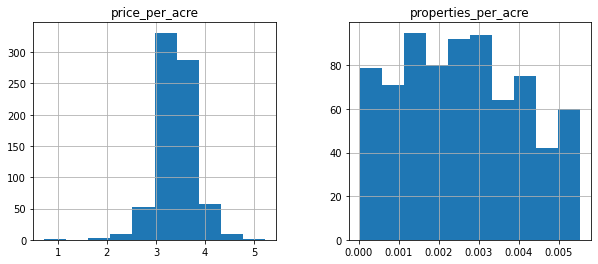

In [21]:
dataset = pd.DataFrame(df_num)

dataset.hist(figsize=(10,4))
plt.show()

In [22]:
df7 = pd.concat([df_cat, df_num], axis=1)
df7.head()

,county_state,price_per_acre,properties_per_acre
0,Abbeville_SC,3.786217,0.004890
1,Adair_KY,3.278754,0.003378
2,Adair_OK,3.261987,0.001400
3,Adams_MS,3.491845,0.000276
4,Adams_WI,3.413722,0.001758


### Building Ordinary Least Squares linear regression model to help build the optimization function

Below, I did not check Cook's D to see if the outlier below 1 price_per_acre (Jackson, IA) created enough leverage to throw off results of the test. Based on the scale, I assume it would not. Had the outlier been 0 and the intercept positioned at 10, for example, this may be worthwhile. Alternatively, if there had been more extreme outlying points in the plot below, Cook's D might also be worth checking.

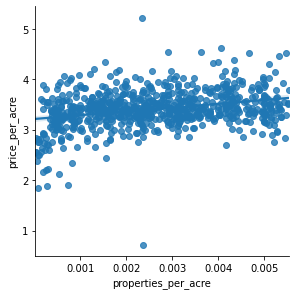

In [23]:
import seaborn as sns

sns.lmplot(x = 'properties_per_acre', y = 'price_per_acre', data = df7, fit_reg = True, size = 4);

In [24]:
import numpy as np
from pandas import DataFrame
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.formula.api import ols
%matplotlib inline

# fit OLS model
model = ols("price_per_acre ~ properties_per_acre", data = df7).fit()
# print model summary
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:         price_per_acre   R-squared:                       0.089
Model:                            OLS   Adj. R-squared:                  0.087
Method:                 Least Squares   F-statistic:                     72.89
Date:                Fri, 29 Jan 2021   Prob (F-statistic):           7.59e-17
Time:                        11:30:59   Log-Likelihood:                -298.48
No. Observations:                 752   AIC:                             601.0
Df Residuals:                     750   BIC:                             610.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept               3.2133    

In [25]:
properties_per_acre = df7['properties_per_acre'].tolist()

In [26]:
b0 = model.params._values[0]
b1 = model.params._values[1]

In [27]:
profitability = []

for i in properties_per_acre:
    scaled_price_per_acre = b0 + b1 * i # if other terms in model, include them here
    profitability.append((i) * scaled_price_per_acre)
    
target_demand = pd.DataFrame({"Properties_Per_Acre": properties_per_acre, "Profitability": profitability})

In [28]:
target_demand[target_demand['Profitability'] == target_demand['Profitability'].max()]

,Properties_Per_Acre,Profitability
76,0.005533,0.020081


In [29]:
best_investment = target_demand[target_demand['Profitability'] == target_demand['Profitability'].max()].iloc[0,0]

In [30]:
df7.head()

,county_state,price_per_acre,properties_per_acre
0,Abbeville_SC,3.786217,0.004890
1,Adair_KY,3.278754,0.003378
2,Adair_OK,3.261987,0.001400
3,Adams_MS,3.491845,0.000276
4,Adams_WI,3.413722,0.001758


In [31]:
best_county_state = df7[df7['properties_per_acre'].round(6) == best_investment.round(6)].iloc[0,0]

In [32]:
df5[df5['county_state'] == best_county_state]

,county_state,price,acres,unique_properties,price_per_acre,properties_per_acre
76,Burt_NE,1084500.0,180.75,1,6000.0,0.005533


In [209]:
df5.sort_values(by=['properties_per_acre'], ascending=False)

,county_state,price,acres,unique_properties,price_per_acre,properties_per_acre
76,Burt_NE,1084500.0,180.75,1,6000.000000,0.005533
24,Bacon_GA,599000.0,180.92,1,3310.855627,0.005527
429,Lincoln_TN,588250.0,181.05,1,3249.102458,0.005523
323,Highland_VA,350000.0,182.34,1,1919.491061,0.005484
659,Sweet Grass_MT,6000000.0,182.80,1,32822.757112,0.005470
...,...,...,...,...,...,...
290,Greenlee_AZ,995000.0,14388.00,1,69.154851,0.000070
332,Hot Springs_WY,3900000.0,16175.00,1,241.112828,0.000062
520,Navajo_AZ,19500000.0,28654.00,1,680.533259,0.000035
163,Converse_WY,21300000.0,58989.00,2,361.084270,0.000034
